## 1. Decision Trees as Interpretable Models

Import packages

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import math
from sklearn import tree
from sklearn.tree import _tree
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression 
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import LassoCV
from sklearn import preprocessing
from sklearn.model_selection import RepeatedKFold
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale 
from sklearn import model_selection
from sklearn.ensemble import GradientBoostingRegressor


### (a) Obtain Data

Get the Accute Inamations Data Set

In [2]:
def get_temp_num(s):
    s = s.replace(',', '.')
    return float(s)

def powerset_labelize(label1, label2):
    if label1 == 0 and label2 == 0:
        return 0
    elif label1 == 0 and label2 == 1:
        return 1
    elif label1 == 1 and label2 == 0:
        return 2
    else:
        return 3

def str2float(s):
    if s == 'yes':
        return 1
    else:
        return 0

col_names = ['Temperature of patient', 'Occurrence of nausea', 
             'Lumbar pain', 'Urine pushing', 'Micturition pains', 
             'Burning of urethra, itch, swelling of urethra outlet', 
             'decision: Inflammation of urinary bladder', 
             'decision: Nephritis of renal pelvis origin']

df = pd.read_csv('../data/diagnosis.csv', names=col_names, sep='\t', encoding='utf16')
df['Temperature of patient'] = df['Temperature of patient'].apply(get_temp_num)
df = df.applymap(str2float)
label = []
for index, row in df.iterrows():
    label1 = row['decision: Inflammation of urinary bladder']
    label2 = row['decision: Nephritis of renal pelvis origin']
    label.append(powerset_labelize(label1, label2))

df['label'] = label
display(df)
X = np.asarray(df.iloc[:, :6])
y = np.asarray(df.iloc[:, -1])
print(X.shape)
print(y.shape)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

,Temperature of patient,Occurrence of nausea,Lumbar pain,Urine pushing,Micturition pains,"Burning of urethra, itch, swelling of urethra outlet",decision: Inflammation of urinary bladder,decision: Nephritis of renal pelvis origin,label
0,0,0,1,0,0,0,0,0,0
1,0,0,0,1,1,1,1,0,2
2,0,0,1,0,0,0,0,0,0
3,0,0,0,1,1,1,1,0,2
4,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
115,0,0,1,1,0,1,0,1,1
116,0,0,0,0,0,0,0,0,0
117,0,1,1,0,1,0,0,1,1
118,0,0,1,1,0,1,0,1,1


(120, 6)
(120,)


### (b) Build a decision tree

1.0


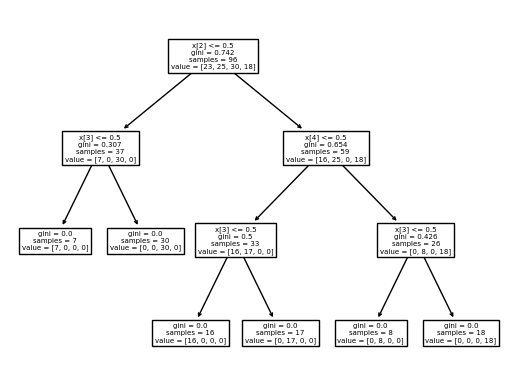

In [3]:
dt = tree.DecisionTreeClassifier(random_state=0)
dt = dt.fit(X_train, y_train)
tree.plot_tree(dt)
print(dt.score(X_test, y_test))

### (c) Convert the decision rules

In [4]:
def tree_to_code(tree, feature_names):
	"""
	Outputs a decision tree model as a Python function
	
	Parameters:
	-----------
	tree: decision tree model
		The decision tree to represent as a function
	feature_names: list
		The feature names of the dataset used for building the decision tree
	"""

	tree_ = tree.tree_
	feature_name = [
		feature_names[i] if i != _tree.TREE_UNDEFINED else "undefined!"
		for i in tree_.feature
	]
	print("def tree({}):".format(", ".join(feature_names)))

	def recurse(node, depth):
		indent = "  " * depth
		if tree_.feature[node] != _tree.TREE_UNDEFINED:
			name = feature_name[node]
			threshold = tree_.threshold[node]
			print("{}if {} <= {}:".format(indent, name, threshold))
			recurse(tree_.children_left[node], depth + 1)
			print("{}else:  # if {} > {}".format(indent, name, threshold))
			recurse(tree_.children_right[node], depth + 1)
		else:
			print("{}return {}".format(indent, tree_.value[node]))

	recurse(0, 1)
	
tree_to_code(dt, ['Temperature of patient', 'Occurrence of nausea', 
             'Lumbar pain', 'Urine pushing', 'Micturition pains', 
             'Burning of urethra, itch, swelling of urethra outlet'])

def tree(Temperature of patient, Occurrence of nausea, Lumbar pain, Urine pushing, Micturition pains, Burning of urethra, itch, swelling of urethra outlet):
  if Lumbar pain <= 0.5:
    if Urine pushing <= 0.5:
      return [[7. 0. 0. 0.]]
    else:  # if Urine pushing > 0.5
      return [[ 0.  0. 30.  0.]]
  else:  # if Lumbar pain > 0.5
    if Micturition pains <= 0.5:
      if Urine pushing <= 0.5:
        return [[16.  0.  0.  0.]]
      else:  # if Urine pushing > 0.5
        return [[ 0. 17.  0.  0.]]
    else:  # if Micturition pains > 0.5
      if Urine pushing <= 0.5:
        return [[0. 8. 0. 0.]]
      else:  # if Urine pushing > 0.5
        return [[ 0.  0.  0. 18.]]


### (d) Use cost-complexity pruning to find a minimal decision tree and a set of decision rules with high interpretability

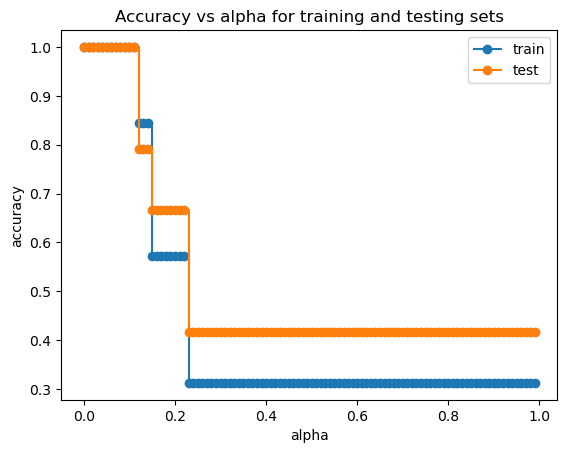

In [5]:
clfs = []
ccp_alphas = [i for i in np.arange(0.0, 1.0, 0.01)]
for ccp_alpha in ccp_alphas:
    clf = tree.DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    clf.fit(X_train, y_train)
    clfs.append(clf)

train_scores = [clf.score(X_train, y_train) for clf in clfs]
test_scores = [clf.score(X_test, y_test) for clf in clfs]

fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker="o", label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker="o", label="test", drawstyle="steps-post")
ax.legend()
plt.show()

### ANS: Based on above figure, not pruning give us the best test result, inorder to show the pruning result, I selected the best one(even though its still worse than original tree).

def tree(Temperature of patient, Occurrence of nausea, Lumbar pain, Urine pushing, Micturition pains, Burning of urethra, itch, swelling of urethra outlet):
  if Lumbar pain <= 0.5:
    return [[ 7.  0. 30.  0.]]
  else:  # if Lumbar pain > 0.5
    if Micturition pains <= 0.5:
      if Urine pushing <= 0.5:
        return [[16.  0.  0.  0.]]
      else:  # if Urine pushing > 0.5
        return [[ 0. 17.  0.  0.]]
    else:  # if Micturition pains > 0.5
      return [[ 0.  8.  0. 18.]]


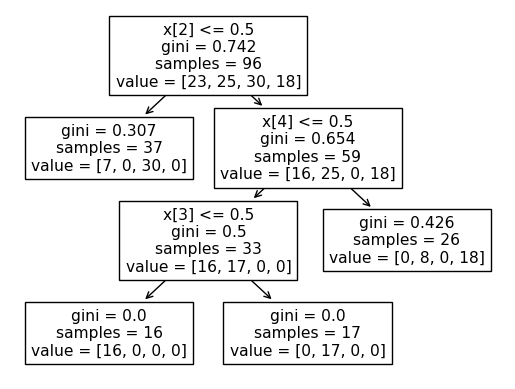

In [6]:
tree.plot_tree(clfs[12])
tree_to_code(clfs[12], ['Temperature of patient', 'Occurrence of nausea', 
             'Lumbar pain', 'Urine pushing', 'Micturition pains', 
             'Burning of urethra, itch, swelling of urethra outlet'])

## 2. The LASSO and Boosting for Regression

### (a) Obtain Data

In [7]:
def questionMark2Null(s):
    if s == '?':
        return np.nan
    else:
        return s
df = pd.read_csv('../data/communities.csv', header=None)
df = df.applymap(questionMark2Null)
display(df)

,0,1,2,3,4,5,6,7,8,9,...,118,119,120,121,122,123,124,125,126,127
0,8,NaN,NaN,Lakewoodcity,1,0.19,0.33,0.02,0.90,0.12,...,0.12,0.26,0.20,0.06,0.04,0.9,0.5,0.32,0.14,0.20
1,53,NaN,NaN,Tukwilacity,1,0.00,0.16,0.12,0.74,0.45,...,0.02,0.12,0.45,NaN,NaN,NaN,NaN,0.00,NaN,0.67
2,24,NaN,NaN,Aberdeentown,1,0.00,0.42,0.49,0.56,0.17,...,0.01,0.21,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.43
3,34,5,81440,Willingborotownship,1,0.04,0.77,1.00,0.08,0.12,...,0.02,0.39,0.28,NaN,NaN,NaN,NaN,0.00,NaN,0.12
4,42,95,6096,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,...,0.04,0.09,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,12,NaN,NaN,TempleTerracecity,10,0.01,0.40,0.10,0.87,0.12,...,0.01,0.28,0.05,NaN,NaN,NaN,NaN,0.00,NaN,0.09
1990,6,NaN,NaN,Seasidecity,10,0.05,0.96,0.46,0.28,0.83,...,0.02,0.37,0.20,NaN,NaN,NaN,NaN,0.00,NaN,0.45
1991,9,9,80070,Waterburytown,10,0.16,0.37,0.25,0.69,0.04,...,0.08,0.32,0.18,0.08,0.06,0.78,0,0.91,0.28,0.23
1992,25,17,72600,Walthamcity,10,0.08,0.51,0.06,0.87,0.22,...,0.03,0.38,0.33,0.02,0.02,0.79,0,0.22,0.18,0.19


### (b) Missing values and Train-Test split

In [8]:
df = df.iloc[:, 5:]
imp = SimpleImputer(missing_values=np.nan, strategy='mean')
imp.fit(df)
cleaned_data = imp.transform(df)
X_train, y_train, X_test, y_test = cleaned_data[:1495, :-1], cleaned_data[:1495, -1], cleaned_data[1495:, :-1], cleaned_data[1495:, -1] 
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(1495, 122) (1495,)
(499, 122) (499,)


### (c) Plot a correlation matrix

In [9]:
corr = np.corrcoef(X_train,rowvar=False)
plt.figure(figsize=(100,100))
sns.heatmap(corr, annot=True, cmap='coolwarm')

<Axes: >

### (d) Calculate the Coefficient of Variation CV

In [10]:
train_df = pd.DataFrame(X_train)
cv = lambda x: np.std(x, ddof=1) / np.mean(x)
train_np = train_df.apply(cv).to_numpy()
print("CV for each feature in the training datset")
display(train_np)

CV for each feature in the training datset


array([2.24110462, 0.35579957, 1.42888542, 0.33021266, 1.35909968,
       1.61209101, 0.36908312, 0.29131481, 0.50030991, 0.41277598,
       2.03846149, 0.64331817, 0.59197817, 0.32861406, 0.70189787,
       0.36533458, 0.36071545, 0.70620589, 0.34542096, 0.54067015,
       0.55807945, 0.51982847, 0.59934055, 0.81836813, 0.61486553,
       0.673217  , 0.48406795, 2.34244312, 0.75446998, 0.68049033,
       0.53375338, 0.59267983, 0.5624247 , 0.3514504 , 0.51352975,
       0.40284885, 0.51637936, 0.43266954, 0.39936609, 0.40406152,
       0.36038983, 0.3739045 , 0.3173754 , 0.33319466, 0.33487557,
       0.33383347, 0.32780083, 0.34068094, 0.33601789, 3.05896435,
       0.92154999, 2.92663525, 0.68148643, 0.59079342, 0.50507218,
       0.45774845, 1.28828699, 1.28618407, 1.26557886, 1.2704761 ,
       0.28999867, 1.45661837, 0.73869155, 0.76319762, 0.3672534 ,
       0.31921445, 0.47365507, 0.34920959, 1.13292565, 0.34355334,
       0.81394709, 1.96846705, 0.2681815 , 0.33612859, 1.05482

### (e) Scatter plots and box plots for highest CV features

Scatterplots


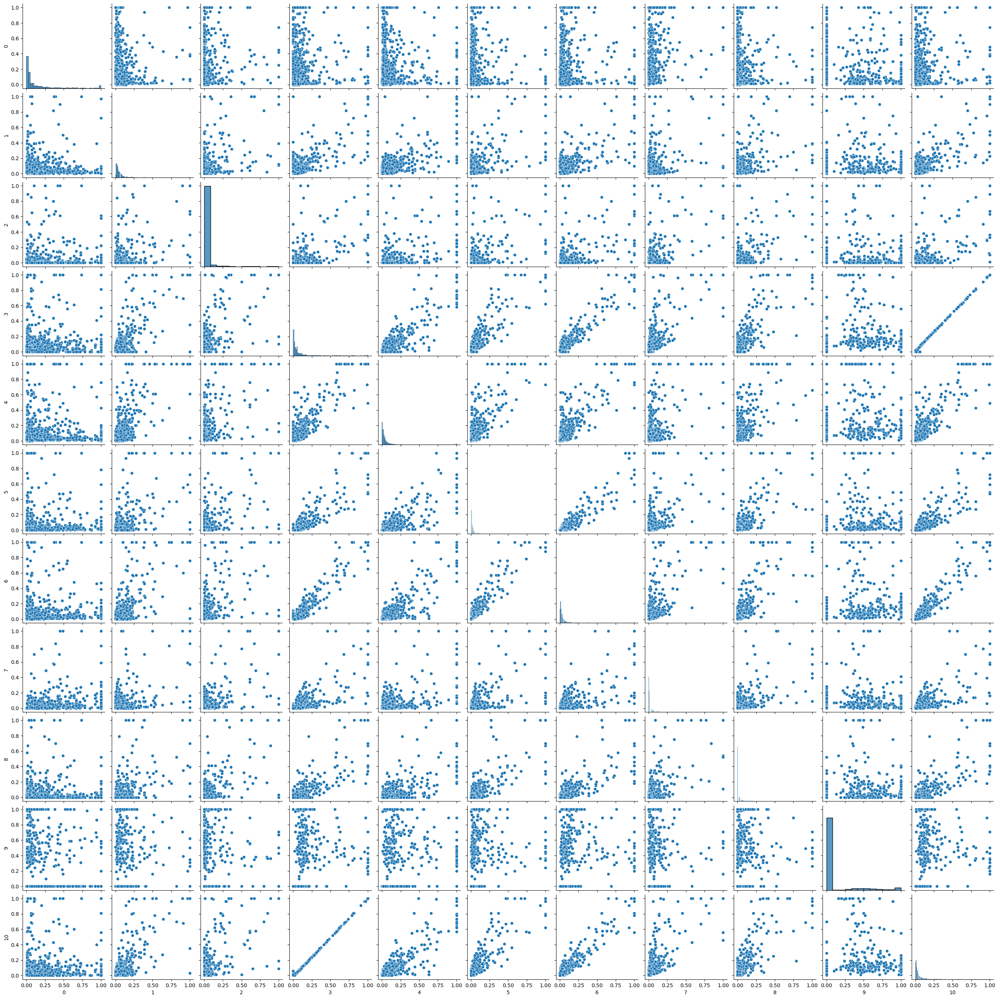

Boxplots


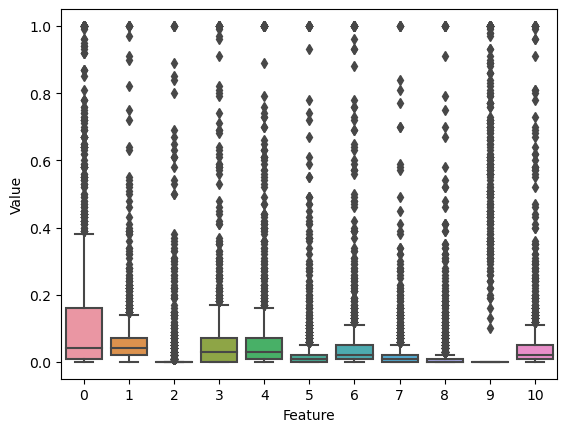

In [11]:
n = math.floor(math.sqrt(128))

# Rearrange the feature indices to make the last n feature had higher CV
selected_feature_index = np.argpartition(train_np, -n)[-n:]
df_selected = pd.DataFrame(X_train[:, selected_feature_index])
print('Scatterplots')
sactter_plot = sns.pairplot(df_selected)
plt.show(sactter_plot)

print('Boxplots')
boxplots = sns.boxplot(data = df_selected).set(xlabel='Feature', ylabel='Value')
plt.show(boxplots)

### Q: Can you draw conclusions about significance of those features, just by the scatter plots? <br>
Ans: Most of them are correlative, especially feature 3 and feature 10.

### (f) Fit a linear model

In [12]:
lr = LinearRegression().fit(X_train, y_train)
y_pred = lr.predict(X_test)
print('Test error:', mean_squared_error(y_test, y_pred))

Test error: 0.7897255274335543


### (g) Fit a ridge regression model

In [13]:
ridge_reg = RidgeCV(cv=5, alphas=[1e-2, 1e-1, 1, 1e+1, 1e+2, 1e+3, 1e+4]).fit(X_train, y_train)
print('Ridge resgression test error:', np.sqrt(mean_squared_error(y_test, ridge_reg.predict(X_test))))


Ridge resgression test error: 0.13318063336800764


### (h) Fit a LASSO model

In [14]:
lasso_reg = LassoCV(cv=5, alphas=[1e-2, 1e-1, 1, 1e+1, 1e+2, 1e+3, 1e+4]).fit(X_train, y_train)
print('Lasso resgression test error:', np.sqrt(mean_squared_error(y_test, lasso_reg.predict(X_test))))
print('Lasso resgression selected variable:', np.nonzero(lasso_reg.coef_))

scaler = preprocessing.StandardScaler().fit(X_train)
X_scaled = scaler.transform(X_train)
lasso_reg = LassoCV(cv=5, alphas=[1e-2, 1e-1, 1, 1e+1, 1e+2, 1e+3, 1e+4]).fit(X_scaled, y_train)
print('Lasso resgression using standardized feature test error:', np.sqrt(mean_squared_error(y_test, lasso_reg.predict(X_test))))
print('Lasso resgression using standardized feature selected variable:', np.nonzero(lasso_reg.coef_))

print('Not using standardized feature has a better result.')

Lasso resgression test error: 0.1446363754530002
Lasso resgression selected variable: (array([ 3, 44, 50], dtype=int64),)
Lasso resgression using standardized feature test error: 0.1901874292777619
Lasso resgression using standardized feature selected variable: (array([ 2,  3, 11, 38, 44, 48, 50, 68, 71, 72, 74, 86, 90, 91],
      dtype=int64),)
Not using standardized feature has a better result.


### (i) Fit a PCR model

In [15]:
pca = PCA()
X_reduced = pca.fit_transform(scale(X_train))
cv = RepeatedKFold(n_splits=5, n_repeats=3)
pcr_reg = LinearRegression()
best_m = None
best_error = float('inf')

for i in range(1, len(X_train[0])):
    error = -1 * model_selection.cross_val_score(pcr_reg, X_reduced[:,:i], y_train, cv=cv, scoring='neg_mean_squared_error').mean()
    if error < best_error:
        best_error = error
        best_m = i

X_reduced_test = pca.transform(scale(X_test))[:,:best_m]
pcr_reg.fit(X_reduced[:,:best_m], y_train)
pred = pcr_reg.predict(X_reduced_test)
print('PCR test error:', np.sqrt(mean_squared_error(y_test, pred)), ', with best M:', best_m)


PCR test error: 0.136856123969495 , with best M: 93


### (j) Fit a boosting tree

In [16]:
alphas = [0.1, 0.01, 0.001, 0.0001]
best_alpha = None
best_error = float('inf')
cv = RepeatedKFold(n_splits=5, n_repeats=3)
bt_X_train = X_reduced[:,:best_m]
bt_X_test = X_reduced_test

for alpha in alphas:
    boosting_tree = GradientBoostingRegressor(n_estimators=10, learning_rate=alpha)
    error = -1 * model_selection.cross_val_score(boosting_tree, bt_X_train, y_train, cv=cv, scoring='neg_mean_squared_error').mean()
    if error < best_error:
        best_error = error
        best_alpha = alpha

bt = GradientBoostingRegressor(n_estimators=10, learning_rate=best_alpha)
bt.fit(bt_X_train, y_train)
pred = bt.predict(bt_X_test)
print('PCR test error:', np.sqrt(mean_squared_error(y_test, pred)), ', with best Alpha:', best_alpha)


PCR test error: 0.161017134728785 , with best Alpha: 0.1
